In [13]:
from datasets.datasets import Income
from datasets.utils import IncomePartitioner
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [29]:
df = pd.read_csv('./experiments.csv', index_col=0)
def plot_bar(df, setting, title):
    set_df = df[df['setting'] == setting]
    accs = []
    stds = []
    for s in set_df['skew'].unique():
        s_accs = []
        s_stds = []
        for c in set_df['clients'].unique():
            fdf = set_df[(set_df['clients'] == c) & (set_df['skew'] == s)]
            mean_acc = fdf['accuracy'].mean()
            std_acc = fdf['accuracy'].std()
            s_accs.append(mean_acc)
            s_stds.append(std_acc)
        accs.append((s, s_accs))
        stds.append((s, s_stds))

    fig = plt.subplots(figsize =(12, 8))
    bar_width = 0.25
    positions = []
    for i in range(len(accs)):
        if i == 0:
            br = np.arange(len(accs[i][1]))
            positions.append(br)
        else:
            br = [x + bar_width for x in positions[i-1]]
            positions.append(br)

        plt.bar(br, accs[i][1], bar_width, label=accs[i][0], yerr=stds[i][1])

    plt.xlabel('Client Number', fontweight='bold', fontsize=15)
    plt.ylabel('Accuracy', fontweight='bold', fontsize=15)
    plt.xticks([r + (bar_width/2) for r in range(len(accs[0][1]))],
            [c for c in set_df['clients'].unique()])
    plt.legend()
    plt.title(title)
    plt.show()

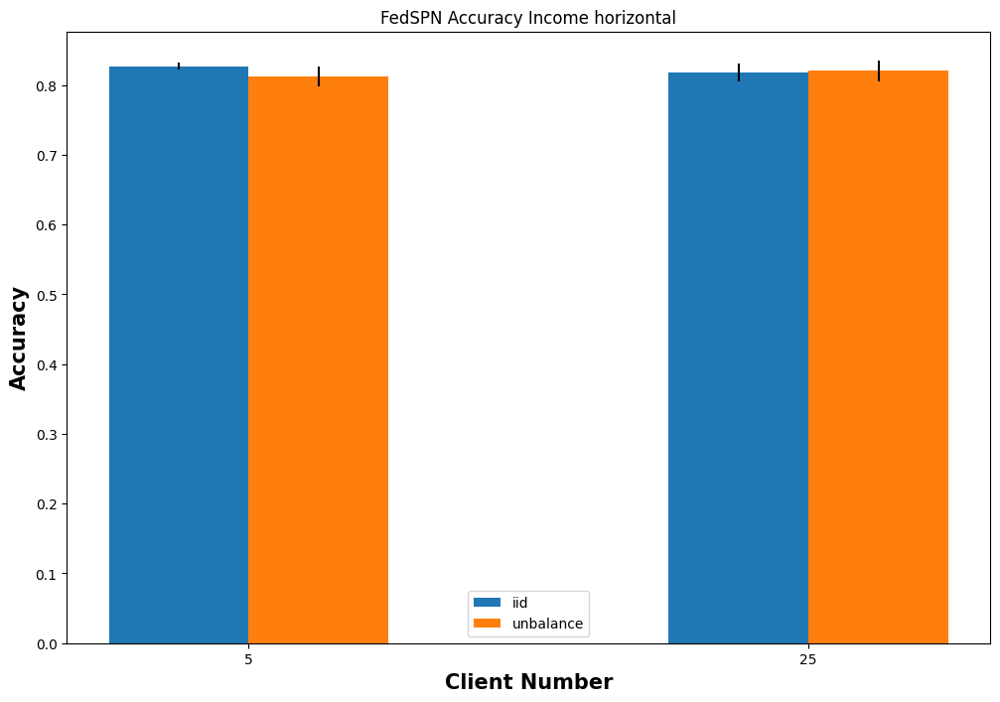

In [30]:
plot_bar(df, 'horizontal', 'FedSPN Accuracy Income horizontal')

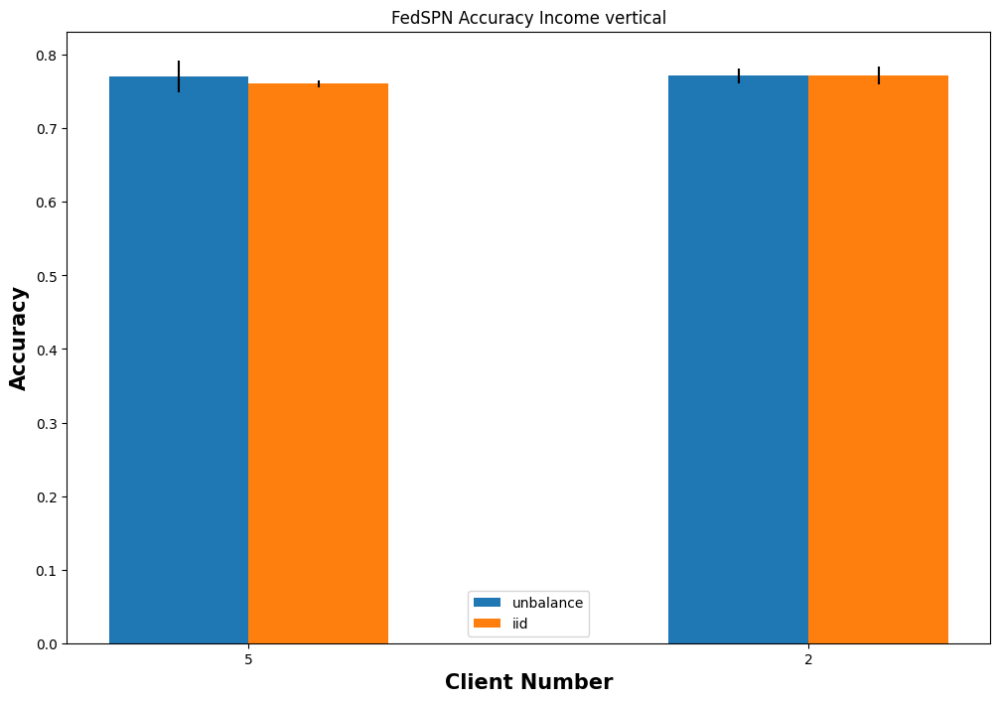

In [32]:
plot_bar(df, 'vertical', 'FedSPN Accuracy Income vertical')

In [3]:
trainset = Income('../../datasets/income/', 'train')
part = IncomePartitioner(trainset.targets, 5, 'unbalance', 0.2)
part

/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.train_data[col][self.train_data[col] >= percentiles] = percentiles
/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.test_data[col][self.test_data[col] >= percentiles] = percentiles
/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

In [8]:
client_dict = {}
for c, v in part.client_dict.items():
    subset = trainset.targets[v]
    p, n = len(subset[subset == 0]), len(subset[subset == 1])
    client_dict[c] = [p, n]
client_dict

{0: [113, 36], 1: [11515, 3636], 2: [141, 50], 3: [185, 55], 4: [11450, 3585]}

In [3]:
from sklearn.ensemble import RandomForestClassifier

In [7]:
X = trainset.features
y = trainset.targets
rf = RandomForestClassifier(100)
rf.fit(X, y)

RandomForestClassifier()

In [8]:
testset = Income('../../datasets/income/', 'test')
X_test, y_test = testset.features, testset.targets
y_pred = rf.predict(X_test)

/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.train_data[col][self.train_data[col] >= percentiles] = percentiles
/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.test_data[col][self.test_data[col] >= percentiles] = percentiles
/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

In [9]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.893691562208522

In [22]:
from utils import random_region_graph, random_region_graph
import networkx as nx
import random

In [23]:
def hierarchy_pos(G, root=None, width=1., vert_gap = 0.2, vert_loc = 0, xcenter = 0.5):

    '''
    From Joel's answer at https://stackoverflow.com/a/29597209/2966723.  
    Licensed under Creative Commons Attribution-Share Alike 
    
    If the graph is a tree this will return the positions to plot this in a 
    hierarchical layout.
    
    G: the graph (must be a tree)
    
    root: the root node of current branch 
    - if the tree is directed and this is not given, 
      the root will be found and used
    - if the tree is directed and this is given, then 
      the positions will be just for the descendants of this node.
    - if the tree is undirected and not given, 
      then a random choice will be used.
    
    width: horizontal space allocated for this branch - avoids overlap with other branches
    
    vert_gap: gap between levels of hierarchy
    
    vert_loc: vertical location of root
    
    xcenter: horizontal location of root
    '''
    if not nx.is_tree(G):
        raise TypeError('cannot use hierarchy_pos on a graph that is not a tree')

    if root is None:
        if isinstance(G, nx.DiGraph):
            root = next(iter(nx.topological_sort(G)))  #allows back compatibility with nx version 1.11
        else:
            root = random.choice(list(G.nodes))

    def _hierarchy_pos(G, root, width=1., vert_gap = 0.2, vert_loc = 0, xcenter = 0.5, pos = None, parent = None):
        '''
        see hierarchy_pos docstring for most arguments

        pos: a dict saying where all nodes go if they have been assigned
        parent: parent of this branch. - only affects it if non-directed

        '''
    
        if pos is None:
            pos = {root:(xcenter,vert_loc)}
        else:
            pos[root] = (xcenter, vert_loc)
        children = list(G.neighbors(root))
        if not isinstance(G, nx.DiGraph) and parent is not None:
            children.remove(parent)  
        if len(children)!=0:
            dx = width/len(children) 
            nextx = xcenter - width/2 - dx/2
            for child in children:
                nextx += dx
                pos = _hierarchy_pos(G,child, width = dx, vert_gap = vert_gap, 
                                    vert_loc = vert_loc-vert_gap, xcenter=nextx,
                                    pos=pos, parent = root)
        return pos

            
    return _hierarchy_pos(G, root, width, vert_gap, vert_loc, xcenter)

In [24]:
g = random_region_graph(0, list(range((28*28)+1)), [])

In [25]:
nx.is_tree(g)

False

In [26]:
from spn.structure.Base import Sum, Product
from spn.structure.leaves.parametric.Parametric import Gaussian, Categorical
from utils import Region, Partition
from scipy.special import softmax
from itertools import product

In [27]:
def region_graph_to_spn(G: nx.DiGraph, curr_layer, scope_dist_mapping, spn_root=None, num_sums=5):
    next_layer = []
    spn = spn_root
    if len(curr_layer) == 0:
        return spn
    for i, node in enumerate(curr_layer):
        if len(list(G.pred[node])) == 0:
            # then we have root node
            spn = Sum()
            spn.weights = np.repeat(1/num_sums**2, num_sums**2)
            spn.scope = node.scope
            node.spn_nodes = [spn]
            next_layer = list(G.succ[node])
        else:
            if type(node) == Partition:
                prods = [Product() for _ in range(num_sums**2)]
                for p in prods:
                    p.scope = node.scope
                pred = list(G.pred[node])[0]
                for s in pred.spn_nodes:
                    s.children = prods
                next_layer += list(G.succ[node])
                node.spn_nodes = prods
            elif type(node) == Region:
                succ = list(G.succ[node])
                if len(succ) == 0:
                    # leaf node
                    scope = node.scope[0]
                    Distribution, params = scope_dist_mapping[scope]
                    sums = [Distribution(**params) for _ in range(num_sums)]
                else:
                    sums = [Sum() for _ in range(num_sums)]
                for s in sums:
                    s.scope = node.scope
                    if type(s) == Sum:
                        s.weights = np.repeat(1/num_sums**2, num_sums**2)
                pred = list(G.pred[node])[0]
                # TODO: use pytorch implementation of SPN
                for k, j in product(list(range(num_sums)), list(range(num_sums))):
                    s = sums[k]
                    if i % 2 == 0:
                        # left side
                        idx = (k*num_sums)+j
                    else:
                        # right side
                        idx = (j*num_sums)+k
                    pred.spn_nodes[idx].children.append(s)
                node.spn_nodes = sums
                next_layer += succ
    return region_graph_to_spn(G, next_layer, scope_dist_mapping, spn, num_sums)

In [43]:
from datasets.utils import get_train_data, get_test_data
from utils import reassign_node_ids

In [29]:
data = get_train_data('mnist', 2)
data = np.concatenate(data).astype(np.float64)

In [30]:
means = data.mean(axis=1)
stds = data.std(axis=1)

In [66]:
scope_dist_mapping = {}
for i in range(28*28):
    scope_dist_mapping[i] = (Gaussian, {'mean': means[i], 'stdev': stds[i]})
scope_dist_mapping[28*28] = (Categorical, { 'p': [1/10 for i in range(10)]})

In [67]:
root = [n for n in g.nodes if len(list(g.pred[n])) == 0 ]
spn = region_graph_to_spn(g, root, scope_dist_mapping, num_sums=3)

In [68]:
from spn.structure.Base import get_topological_order_layers
layers = get_topological_order_layers(spn)
len(layers)

21

In [69]:
for layer in layers:
    for n in layer:
        if type(n) == Sum:
            print(n.children)

[ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0]
[ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0]
[ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0]
[ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0]
[ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0]
[ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0]
[ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0, ProductNode_0]
[ProductNode_0, ProductNode_0, ProductNode_0, Pr

In [70]:
from spn.algorithms.EM import EM_optimization
from spn.structure.Base import get_nodes_by_type
from spn.algorithms.Inference import log_likelihood
from spn.structure.leaves.parametric.EM import gaussian_em_update

In [71]:
log_likelihood(spn, data)

array([[-228.8008037 ],
       [-187.42346655],
       [-134.98786196],
       ...,
       [-304.451765  ],
       [-174.91055912],
       [-211.8395229 ]])

In [72]:
spn = reassign_node_ids(spn)
EM_optimization(spn, data, iterations=1)

[array([0., 0., 0., ..., 0., 0., 0.])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([-2.19722458, -2.19722458, -2.19722458, ..., -2.19722458,
       -2.19722458, -2.19722458])]
[array([ -95.60407289, -118.8907194 ,  -88.9777861 , ..., -13

ValueError: could not broadcast input array from shape (180000,) into shape (60000,)

In [24]:
spn.children[0].children[0].children[0].children[0].weights

array([1.])

In [33]:
a = np.arange(0, 10)
np.concatenate([a, a]).shape

(20,)

In [34]:
data.shape

(60000, 785)

In [35]:
from spn.structure.Base import assign_ids, rebuild_scopes_bottom_up


p0 = Product(children=[Categorical(p=[0.3, 0.7], scope=1), Categorical(p=[0.4, 0.6], scope=2)])
p1 = Product(children=[Categorical(p=[0.5, 0.5], scope=1), Categorical(p=[0.6, 0.4], scope=2)])
s1 = Sum(weights=[0.3, 0.7], children=[p0, p1])
#s2 = Sum(weights=[0.3, 0.7], children=[p0, p1])
#p5 = Product(children=[Categorical(p=[0.2, 0.8], scope=0), s2])
p2 = Product(children=[Categorical(p=[0.2, 0.8], scope=0), s1])
p3 = Product(children=[Categorical(p=[0.2, 0.8], scope=0), Categorical(p=[0.3, 0.7], scope=1)])
p4 = Product(children=[p3, Categorical(p=[0.4, 0.6], scope=2)])
spn = Sum(weights=[0.4, 0.6], children=[p2, p4])

assign_ids(spn)
rebuild_scopes_bottom_up(spn)

SumNode_0

In [36]:
test_data = np.array([[1.0, 0.0, 1.0],
                      [0.0, 1.0, 0.0],
                      [1.0, 1.0, 1.0],
                      [0.0, 1.0, 0.0],
                      [1.0, 0.0, 1.0]
                      ]).reshape(-1, 3)

In [37]:
log_likelihood(spn, test_data)

array([[-1.90730501],
       [-2.86260096],
       [-1.24924915],
       [-2.86260096],
       [-1.90730501]])

In [ ]:
EM_optimization(spn, test_data)

[-2.55618785 -2.14046624 -2.2405497  -2.14046624 -2.55618785]
[-1.13943428 -2.52572864 -1.13943428 -2.52572864 -1.13943428]
[-1.02165125 -1.42711636 -1.02165125 -1.42711636 -1.02165125]
[-1.93794198 -2.47693848 -1.09064412 -2.47693848 -1.93794198]
[-2.22562405 -1.7837913  -1.37832619 -1.7837913  -2.22562405]
[-1.2447948  -3.03655427 -1.2447948  -3.03655427 -1.2447948 ]
[-2.85423271 -4.64599218 -2.85423271 -4.64599218 -2.85423271]
[-3.54737989 -4.08637639 -2.70008203 -4.08637639 -3.54737989]
[-2.41239996 -3.39322921 -2.41239996 -3.39322921 -2.41239996]
[-2.18925641 -3.57555077 -2.18925641 -3.57555077 -2.18925641]
[-2.5792647  -2.16315392 -2.25335433 -2.16315392 -2.5792647 ]
[-1.16136741 -2.54766177 -1.16136741 -2.54766177 -1.16136741]
[-1.00729194 -1.41275705 -1.00729194 -1.41275705 -1.00729194]
[-1.92358267 -2.46257917 -1.07628481 -2.46257917 -1.92358267]
[-2.21126474 -1.76943199 -1.36396688 -1.76943199 -2.21126474]
[-1.23043549 -3.02219496 -1.23043549 -3.02219496 -1.23043549]
[-2.8398

In [13]:
from spn.algorithms.LearningWrappers import learn_classifier, learn_mspn, learn_parametric
from spn.structure.Base import Context
from context import ctxts

In [38]:
data = get_train_data('mnist', 2)
data = np.concatenate(data).astype(np.float64)
spns = []
for _ in range(60):
    idx = np.random.choice(list(range(len(data))), 1000, False)
    local_data = data[idx]
    data = data[~idx]
    context = Context(parametric_types=[Gaussian]*784 + [Categorical])
    context.add_domains(local_data)
    spn = learn_classifier(local_data, context, learn_parametric, 784)
    spns.append(spn)
root = Sum(np.repeat(1/60, 60), spns)

/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.train_data[col][self.train_data[col] >= percentiles] = percentiles
/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.test_data[col][self.test_data[col] >= percentiles] = percentiles
/home/jonas/dev/federated-learning/federated-spn/src/network-aligned-spn/datasets/datasets.py:108: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See

torch.Size([43957, 14])

In [62]:
test_data = get_test_data('mnist')
test_data

array([[0, 0, 0, ..., 0, 0, 7],
       [0, 0, 0, ..., 0, 0, 2],
       [0, 0, 0, ..., 0, 0, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 4],
       [0, 0, 0, ..., 0, 0, 5],
       [0, 0, 0, ..., 0, 0, 6]])

In [49]:
test_data = test_data.astype(np.float32)

In [50]:
test_data[:, -1] = np.nan

In [53]:
from spn.algorithms.MPE import mpe
from spn.structure.Base import assign_ids

In [59]:
root = assign_ids(root)
root.scope = root.children[0].scope
pred = mpe(root, test_data[:100])

/home/jonas/anaconda3/envs/federated-spn/lib/python3.11/site-packages/spn/structure/leaves/parametric/Inference.py:88: RuntimeWarning: divide by zero encountered in log
  probs[idx_in] = np.array(np.log(node.p))[cat_data[~out_domain_ids]]


[array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])]
[array([ 1,  2,  4,  6,  8,  9, 10, 14, 15, 16, 17, 18, 20, 21, 22, 23, 24,
       26, 27, 29, 30, 31, 32, 33, 35, 36, 37, 38, 40, 41, 43, 44, 45, 46,
       48, 50, 52, 53, 55, 56, 57, 58, 59, 60, 63, 66, 67, 68, 69, 70, 72,
       73, 74, 75, 76, 79, 81, 82, 83, 84, 88, 89, 90, 91, 93, 94, 96, 97,
       99])]
[array([ 0,  3,  5,  7, 11, 12, 13, 19, 25, 28, 34, 39, 42, 47, 49, 51, 54,
       61, 62, 64, 65, 71, 77, 78, 80, 85, 86, 87, 92, 95, 98])]
[array([], dtype=int64)]
[array([], dtype=int64)]
[array([], dtype=int64)]
[array([], dtype=int64)]


In [60]:
from sklearn.metrics import accuracy_score

In [63]:
accuracy_score(test_data[:100, -1], pred[:100, -1])

0.58

In [1]:
from datasets.datasets import Avazu
avazu = Avazu('../../datasets/avazu/', 'train')

: 

: 

In [5]:
from einet.layers import Sum
import torch
a = Sum(50, 1, 10)

In [24]:
x = torch.ones((1, 64, 50, 1))
w = torch.ones((1, 50, 10, 1))
w /= 5
#w = w.unsqueeze(0)
#w = w.unsqueeze(3)
print(w.shape)
w[0, 0, 0, 0] = 0.3
w[0, 0, 1, 0] = 0.1
a.weights = torch.nn.Parameter(w)

torch.Size([1, 50, 10, 1])


In [25]:
a(x).shape

torch.Size([1, 64, 10, 1])